In [6]:
# for charts
import plotly.express as px

# to read and wrangle data
import pandas as pd

# to import data from LA Data portal
from sodapy import Socrata

# to create spatial dataabs
import geopandas as gpd

# for basemaps
import contextily as ctx

# for interactive leaflet mapping
import folium

# import our files
housing = pd.read_csv("../data/ACS 2009-13 Data/Essentials_Housing Tenure_2009_13 NEW.csv")

lapd_divisions = gpd.read_file('../data/lapd-divisions.geojson')

tracts=gpd.read_file('../data/la_tracts.geojson')

race = pd.read_csv("../data/ACS 2009-13 Data/Race_2009_13 NEW.csv")

income = pd.read_csv("../data/ACS 2009-13 Data/Income 2009_13 NEW.csv")

In [7]:
## Police Division Boundaries

In [8]:
# we need to look at our police divisions to see what kind of information it has

lapd_divisions.head()

,kind,external_id,name,slug,set,metadata,resource_uri,geometry
0,LAPD Division,12,77th Street,77th-street-lapd-division,/1.0/boundary-set/lapd-divisions/,"{'name': '77th Street', 'url': 'http://www.lap...",/1.0/boundary/77th-street-lapd-division/,"MULTIPOLYGON (((-118.31489 34.00372, -118.2810..."
1,LAPD Division,1,Central,central-lapd-division,/1.0/boundary-set/lapd-divisions/,"{'name': 'Central', 'url': 'http://www.lapdonl...",/1.0/boundary/central-lapd-division/,"MULTIPOLYGON (((-118.22438 34.06851, -118.2244..."
2,LAPD Division,17,Devonshire,devonshire-lapd-division,/1.0/boundary-set/lapd-divisions/,"{'name': 'Devonshire', 'url': 'http://www.lapd...",/1.0/boundary/devonshire-lapd-division/,"MULTIPOLYGON (((-118.48964 34.31514, -118.4863..."
3,LAPD Division,16,Foothill,foothill-lapd-division,/1.0/boundary-set/lapd-divisions/,"{'name': 'Foothill', 'url': 'http://www.lapdon...",/1.0/boundary/foothill-lapd-division/,"MULTIPOLYGON (((-118.38291 34.29425, -118.3829..."
4,LAPD Division,5,Harbor,harbor-lapd-division,/1.0/boundary-set/lapd-divisions/,"{'name': 'Harbor', 'url': 'http://www.lapdonli...",/1.0/boundary/harbor-lapd-division/,"MULTIPOLYGON (((-118.28151 33.86635, -118.2814..."


In [9]:
# great. we only really needed this data to have a geometry column in order to visualize police division boundaries in a map, so nothing else to do here. We can move on to other data variables

In [10]:
## Analyzing housing data
# We are going to analyze income, housing, and race, but we'll look at housing first. What we plan to do is look at each demographic variable, and then overlay that onto our police divisions.

In [11]:
# let's look at our data 

housing.head()

,FIPS,Name of Area,Qualifying Name,State (FIPS),County,Census Tract,Total Population,Housing Units,Occupied Housing Units:,Occupied Housing Units: Owner Occupied,Occupied Housing Units: Renter Occupied
0,6001400100,"Census Tract 4001, Alameda County, California","Census Tract 4001, Alameda County, California",6,1,400100,3353,1384,1293,1061,232
1,6001400200,"Census Tract 4002, Alameda County, California","Census Tract 4002, Alameda County, California",6,1,400200,1944,891,830,574,256
2,6001400300,"Census Tract 4003, Alameda County, California","Census Tract 4003, Alameda County, California",6,1,400300,5376,2600,2472,1101,1371
3,6001400400,"Census Tract 4004, Alameda County, California","Census Tract 4004, Alameda County, California",6,1,400400,4152,1950,1902,791,1111
4,6001400500,"Census Tract 4005, Alameda County, California","Census Tract 4005, Alameda County, California",6,1,400500,3618,1682,1587,569,1018


In [12]:
# we've hit the leading zero problem; we need to specify FIPS columns as a string to add leading zero
housing = pd.read_csv(
    '../data/ACS 2009-13 Data/Essentials_Housing Tenure_2009_13 NEW.csv',
    dtype=
    {
        'FIPS':str,
        'State (FIPS)':str,
        'County': str
    }
)

# add additional code to specify FIPS column as a string; check to see whether the change has been made
housing['FIPS'] = housing['FIPS'].str.zfill(11)
housing.head()

,FIPS,Name of Area,Qualifying Name,State (FIPS),County,Census Tract,Total Population,Housing Units,Occupied Housing Units:,Occupied Housing Units: Owner Occupied,Occupied Housing Units: Renter Occupied
0,06001400100,"Census Tract 4001, Alameda County, California","Census Tract 4001, Alameda County, California",6,1,400100,3353,1384,1293,1061,232
1,06001400200,"Census Tract 4002, Alameda County, California","Census Tract 4002, Alameda County, California",6,1,400200,1944,891,830,574,256
2,06001400300,"Census Tract 4003, Alameda County, California","Census Tract 4003, Alameda County, California",6,1,400300,5376,2600,2472,1101,1371
3,06001400400,"Census Tract 4004, Alameda County, California","Census Tract 4004, Alameda County, California",6,1,400400,4152,1950,1902,791,1111
4,06001400500,"Census Tract 4005, Alameda County, California","Census Tract 4005, Alameda County, California",6,1,400500,3618,1682,1587,569,1018


In [13]:
housing.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8057 entries, 0 to 8056
Data columns (total 11 columns):
 #   Column                                   Non-Null Count  Dtype 
---  ------                                   --------------  ----- 
 0   FIPS                                     8057 non-null   object
 1   Name of Area                             8057 non-null   object
 2   Qualifying Name                          8057 non-null   object
 3   State (FIPS)                             8057 non-null   object
 4   County                                   8057 non-null   object
 5   Census Tract                             8057 non-null   int64 
 6   Total Population                         8057 non-null   int64 
 7   Housing Units                            8057 non-null   int64 
 8   Occupied Housing Units:                  8057 non-null   int64 
 9   Occupied Housing Units: Owner Occupied   8057 non-null   int64 
 10  Occupied Housing Units: Renter Occupied  8057 non-null   int

In [14]:
# check to see how many columns have all null values
housing.columns[housing.isna().all()].tolist()

# check to see how many columns have any null values
housing.columns[housing.isna().any()].tolist()

[]

In [15]:
# rename our columns to make them cleaner and more concise

columns = list(housing) 
columns

['FIPS',
 'Name of Area',
 'Qualifying Name',
 'State (FIPS)',
 'County',
 'Census Tract',
 'Total Population',
 'Housing Units',
 'Occupied Housing Units:',
 'Occupied Housing Units: Owner Occupied',
 'Occupied Housing Units: Renter Occupied']

In [16]:
housing.columns = ['FIPS',
 'area',
 'qualifying_name',
 'state_FIPS',
 'county_FIPS',
 'census_tract',
 'total_pop',
 'housing_units',
 'total_occupied_housing_units',
 'owner_occupied',
 'renter_occupied']

In [17]:
# great! since we've cleaned and prepped our housing data, we now need to give it a spatial quality in order to map it.
# to do that, we'll merge or join it with census tract data since they both share a FIPS code column. Let's first look at census tracts 
tracts.head()

,kind,external_id,name,slug,set,metadata,resource_uri,geometry
0,Census Tract (2012),06037101110,06037101110,06037101110-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2594737', 'NAME': '1011.10',...",/1.0/boundary/06037101110-census-tract-2012/,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007..."
1,Census Tract (2012),06037101122,06037101122,06037101122-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2677213', 'NAME': '1011.22',...",/1.0/boundary/06037101122-census-tract-2012/,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031..."
2,Census Tract (2012),06037101210,06037101210,06037101210-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2529724', 'NAME': '1012.10',...",/1.0/boundary/06037101210-census-tract-2012/,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859..."
3,Census Tract (2012),06037101220,06037101220,06037101220-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2516085', 'NAME': '1012.20',...",/1.0/boundary/06037101220-census-tract-2012/,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859..."
4,Census Tract (2012),06037101300,06037101300,06037101300-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2487732', 'NAME': '1013', 'I...",/1.0/boundary/06037101300-census-tract-2012/,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719..."


In [18]:
# learn more about this dataset
tracts.info(verbose=True, null_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2346 entries, 0 to 2345
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   kind          2346 non-null   object  
 1   external_id   2346 non-null   object  
 2   name          2346 non-null   object  
 3   slug          2346 non-null   object  
 4   set           2346 non-null   object  
 5   metadata      2346 non-null   object  
 6   resource_uri  2346 non-null   object  
 7   geometry      2346 non-null   geometry
dtypes: geometry(1), object(7)
memory usage: 146.8+ KB


In [19]:
# drop and rename columns
tracts = tracts[['name','geometry']]

tracts.columns = ['FIPS','geometry']

tracts.head()

,FIPS,geometry
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007..."
1,06037101122,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031..."
2,06037101210,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859..."
3,06037101220,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859..."
4,06037101300,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719..."


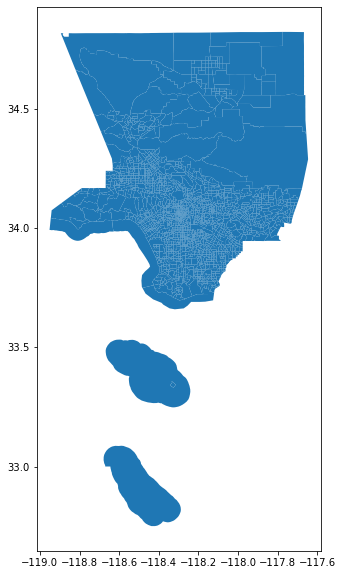

In [20]:
# what does it look like on a map?

tracts.plot(figsize=(12,10))

In [21]:
# let's now merge race data on census tracts

tracts_housing=tracts.merge(housing,on="FIPS")

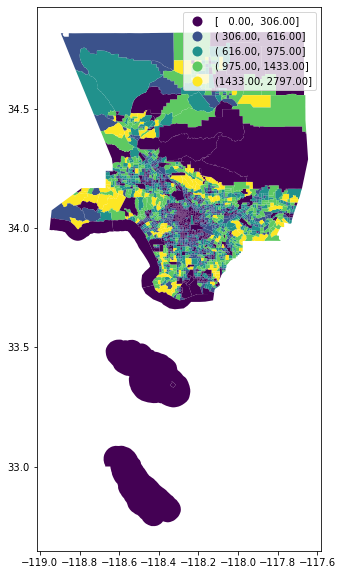

In [14]:
# and test out mapping it!

tracts_housing.plot(figsize=(12,10),
                 column='owner_occupied',
                 legend=True, 
                 scheme='NaturalBreaks')

In [13]:
# awesome! now that we've joined it, let's check to see what columns we have

tracts_housing.head()

,FIPS,geometry,area,qualifying_name,state_FIPS,county_FIPS,census_tract,total_pop,housing_units,total_occupied_housing_units,owner_occupied,renter_occupied
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007...","Census Tract 1011.10, Los Angeles County, Cali...","Census Tract 1011.10, Los Angeles County, Cali...",6,37,101110,5012,1757,1682,859,823
1,06037101122,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031...","Census Tract 1011.22, Los Angeles County, Cali...","Census Tract 1011.22, Los Angeles County, Cali...",6,37,101122,3504,1356,1228,1045,183
2,06037101210,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859...","Census Tract 1012.10, Los Angeles County, Cali...","Census Tract 1012.10, Los Angeles County, Cali...",6,37,101210,6604,2352,2216,323,1893
3,06037101220,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859...","Census Tract 1012.20, Los Angeles County, Cali...","Census Tract 1012.20, Los Angeles County, Cali...",6,37,101220,3123,1282,1167,424,743
4,06037101300,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719...","Census Tract 1013, Los Angeles County, California","Census Tract 1013, Los Angeles County, California",6,37,101300,4247,1571,1529,1251,278


In [22]:
# looks great! we now have a geometry column. 
# now, let's begin our steps needed to create an interactive map, overlaying our new housing dataframe with police divisions. First, let's set the coordinate reference system to WGS84
crs = {'init': 'epsg:4326'}

In [23]:
lapd_divisions.head()

,kind,external_id,name,slug,set,metadata,resource_uri,geometry
0,LAPD Division,12,77th Street,77th-street-lapd-division,/1.0/boundary-set/lapd-divisions/,"{'name': '77th Street', 'url': 'http://www.lap...",/1.0/boundary/77th-street-lapd-division/,"MULTIPOLYGON (((-118.31489 34.00372, -118.2810..."
1,LAPD Division,1,Central,central-lapd-division,/1.0/boundary-set/lapd-divisions/,"{'name': 'Central', 'url': 'http://www.lapdonl...",/1.0/boundary/central-lapd-division/,"MULTIPOLYGON (((-118.22438 34.06851, -118.2244..."
2,LAPD Division,17,Devonshire,devonshire-lapd-division,/1.0/boundary-set/lapd-divisions/,"{'name': 'Devonshire', 'url': 'http://www.lapd...",/1.0/boundary/devonshire-lapd-division/,"MULTIPOLYGON (((-118.48964 34.31514, -118.4863..."
3,LAPD Division,16,Foothill,foothill-lapd-division,/1.0/boundary-set/lapd-divisions/,"{'name': 'Foothill', 'url': 'http://www.lapdon...",/1.0/boundary/foothill-lapd-division/,"MULTIPOLYGON (((-118.38291 34.29425, -118.3829..."
4,LAPD Division,5,Harbor,harbor-lapd-division,/1.0/boundary-set/lapd-divisions/,"{'name': 'Harbor', 'url': 'http://www.lapdonli...",/1.0/boundary/harbor-lapd-division/,"MULTIPOLYGON (((-118.28151 33.86635, -118.2814..."


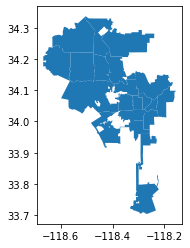

In [24]:
# do a quick plot

lapd_divisions.plot()

In [25]:
# see what the data looks like

tracts_housing.head()

,FIPS,geometry,area,qualifying_name,state_FIPS,county_FIPS,census_tract,total_pop,housing_units,total_occupied_housing_units,owner_occupied,renter_occupied
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007...","Census Tract 1011.10, Los Angeles County, Cali...","Census Tract 1011.10, Los Angeles County, Cali...",6,37,101110,5012,1757,1682,859,823
1,06037101122,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031...","Census Tract 1011.22, Los Angeles County, Cali...","Census Tract 1011.22, Los Angeles County, Cali...",6,37,101122,3504,1356,1228,1045,183
2,06037101210,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859...","Census Tract 1012.10, Los Angeles County, Cali...","Census Tract 1012.10, Los Angeles County, Cali...",6,37,101210,6604,2352,2216,323,1893
3,06037101220,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859...","Census Tract 1012.20, Los Angeles County, Cali...","Census Tract 1012.20, Los Angeles County, Cali...",6,37,101220,3123,1282,1167,424,743
4,06037101300,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719...","Census Tract 1013, Los Angeles County, California","Census Tract 1013, Los Angeles County, California",6,37,101300,4247,1571,1529,1251,278


In [28]:
# okay, let's pull all of it together in a map with the police division boundaries!!

m1 = folium.Map(location=[34.2,-118.2], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')

# plot chorpleth over the base map
folium.Choropleth(
                  name="Density of Renters",
                  geo_data=tracts_housing, # geo data
                  data=tracts_housing, # data          
                  key_on='feature.properties.FIPS', # key, or merge column
                  columns=['FIPS', 'owner_occupied'], # [key, value]
                  fill_color='YlOrRd',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, # line opacity (of the border)
                  legend_name='Renter Occupied Units (2009-2014 ACS 5-Year estimates)').add_to(m1)    # name on the legend color bar

Boundaries = folium.GeoJson(
    lapd_divisions,
    name="LAPD Police Boundaries",
    style_function = lambda x: {
        'color': 'gray',
        'weight': 2,
        'fillOpacity': .2,
        'line_opacity': 1,
        'interactive':False
}).add_to(m1)

# add a nice layer control
folium.LayerControl().add_to(m1)


m1

In [29]:
# incredible! we can turned on layers so now we can turn layers off and on. we need to save it

m1.save('2009_14_housing_final.html')

In [ ]:
## Moving on to analyzing income

In [23]:
# see what it looks like

income.head()

,FIPS,Name of Area,Qualifying Name,State (FIPS),County,Census Tract,Total Population,Households: [Dollars adjusted for inflation to match value in 2018],Median Household Income (In 2018 Inflation Adjusted Dollars) [Dollars adjusted for inflation to match value in 2018],"Households: Less than $10,000 [Dollars adjusted for inflation to match value in 2018]",...,Median Household Income (In 2018 Inflation Adjusted Dollars): Black or African American Alone Householder [Dollars adjusted for inflation to match value in 2018],Median Household Income (In 2018 Inflation Adjusted Dollars): American Indian and Alaska Native Alone Householder [Dollars adjusted for inflation to match value in 2018],Median Household Income (In 2018 Inflation Adjusted Dollars): Asian Alone [Dollars adjusted for inflation to match value in 2018],Median Household Income (In 2018 Inflation Adjusted Dollars): Native Hawaiian and Other Pacific Islander Alone Householder [Dollars adjusted for inflation to match value in 2018],Median Household Income (In 2018 Inflation Adjusted Dollars): Some Other Race Alone Householder [Dollars adjusted for inflation to match value in 2018],Median Household Income (In 2018 Inflation Adjusted Dollars): Two or More Races Householder [Dollars adjusted for inflation to match value in 2018],Median Household Income (In 2018 Inflation Adjusted Dollars): Hispanic or Latino Householder [Dollars adjusted for inflation to match value in 2018],"Median Household Income (In 2018 Inflation Adjusted Dollars): White Alone Householder, Not Hispanic or Latino [Dollars adjusted for inflation to match value in 2018]",Median Household Income Occupied Housing Units: Owner Occupied [Dollars adjusted for inflation to match value in 2018],Median Household Income Occupied Housing Units: Renter Occupied [Dollars adjusted for inflation to match value in 2018]
0,6037101110,"Census Tract 1011.10, Los Angeles County, Cali...","Census Tract 1011.10, Los Angeles County, Cali...",6,37,101110,5012,1682,53937.0,125,...,NaN,NaN,50237.0,NaN,31042.0,NaN,36710.0,59963.0,89269.0,30516.0
1,6037101122,"Census Tract 1011.22, Los Angeles County, Cali...","Census Tract 1011.22, Los Angeles County, Cali...",6,37,101122,3504,1228,110793.0,67,...,NaN,NaN,118093.0,NaN,47237.0,95061.0,95824.0,109676.0,115019.0,70374.0
2,6037101210,"Census Tract 1012.10, Los Angeles County, Cali...","Census Tract 1012.10, Los Angeles County, Cali...",6,37,101210,6604,2216,46776.0,155,...,29408.0,NaN,17017.0,NaN,37305.0,107107.0,39424.0,48957.0,67212.0,42088.0
3,6037101220,"Census Tract 1012.20, Los Angeles County, Cali...","Census Tract 1012.20, Los Angeles County, Cali...",6,37,101220,3123,1167,41464.0,84,...,NaN,NaN,38158.0,NaN,74230.0,16702.0,52765.0,38184.0,67752.0,27525.0
4,6037101300,"Census Tract 1013, Los Angeles County, California","Census Tract 1013, Los Angeles County, California",6,37,101300,4247,1529,85671.0,80,...,NaN,NaN,84427.0,NaN,NaN,NaN,84432.0,87614.0,94711.0,84059.0


In [17]:
# again, specify FIPS columns as a string to add leading zero
income = pd.read_csv(
    '../data/ACS 2009-13 Data/Income 2009_13 NEW.csv',
    dtype=
    {
        'FIPS':str,
        'State (FIPS)':str,
        'County': str
    }
)

# add additional code to specify FIPS column as a string; check to see whether the change has been made
income['FIPS'] = income['FIPS'].str.zfill(11)
income.head()

,FIPS,Name of Area,Qualifying Name,State (FIPS),County,Census Tract,Total Population,Households: [Dollars adjusted for inflation to match value in 2018],Median Household Income (In 2018 Inflation Adjusted Dollars) [Dollars adjusted for inflation to match value in 2018],"Households: Less than $10,000 [Dollars adjusted for inflation to match value in 2018]",...,Median Household Income (In 2018 Inflation Adjusted Dollars): Black or African American Alone Householder [Dollars adjusted for inflation to match value in 2018],Median Household Income (In 2018 Inflation Adjusted Dollars): American Indian and Alaska Native Alone Householder [Dollars adjusted for inflation to match value in 2018],Median Household Income (In 2018 Inflation Adjusted Dollars): Asian Alone [Dollars adjusted for inflation to match value in 2018],Median Household Income (In 2018 Inflation Adjusted Dollars): Native Hawaiian and Other Pacific Islander Alone Householder [Dollars adjusted for inflation to match value in 2018],Median Household Income (In 2018 Inflation Adjusted Dollars): Some Other Race Alone Householder [Dollars adjusted for inflation to match value in 2018],Median Household Income (In 2018 Inflation Adjusted Dollars): Two or More Races Householder [Dollars adjusted for inflation to match value in 2018],Median Household Income (In 2018 Inflation Adjusted Dollars): Hispanic or Latino Householder [Dollars adjusted for inflation to match value in 2018],"Median Household Income (In 2018 Inflation Adjusted Dollars): White Alone Householder, Not Hispanic or Latino [Dollars adjusted for inflation to match value in 2018]",Median Household Income Occupied Housing Units: Owner Occupied [Dollars adjusted for inflation to match value in 2018],Median Household Income Occupied Housing Units: Renter Occupied [Dollars adjusted for inflation to match value in 2018]
0,06037101110,"Census Tract 1011.10, Los Angeles County, Cali...","Census Tract 1011.10, Los Angeles County, Cali...",6,37,101110,5012,1682,53937.0,125,...,NaN,NaN,50237.0,NaN,31042.0,NaN,36710.0,59963.0,89269.0,30516.0
1,06037101122,"Census Tract 1011.22, Los Angeles County, Cali...","Census Tract 1011.22, Los Angeles County, Cali...",6,37,101122,3504,1228,110793.0,67,...,NaN,NaN,118093.0,NaN,47237.0,95061.0,95824.0,109676.0,115019.0,70374.0
2,06037101210,"Census Tract 1012.10, Los Angeles County, Cali...","Census Tract 1012.10, Los Angeles County, Cali...",6,37,101210,6604,2216,46776.0,155,...,29408.0,NaN,17017.0,NaN,37305.0,107107.0,39424.0,48957.0,67212.0,42088.0
3,06037101220,"Census Tract 1012.20, Los Angeles County, Cali...","Census Tract 1012.20, Los Angeles County, Cali...",6,37,101220,3123,1167,41464.0,84,...,NaN,NaN,38158.0,NaN,74230.0,16702.0,52765.0,38184.0,67752.0,27525.0
4,06037101300,"Census Tract 1013, Los Angeles County, California","Census Tract 1013, Los Angeles County, California",6,37,101300,4247,1529,85671.0,80,...,NaN,NaN,84427.0,NaN,NaN,NaN,84432.0,87614.0,94711.0,84059.0


In [18]:
# learn more about this data

income.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2346 entries, 0 to 2345
Data columns (total 36 columns):
 #   Column                                                                                                                                                                               Non-Null Count  Dtype  
---  ------                                                                                                                                                                               --------------  -----  
 0   FIPS                                                                                                                                                                                 2346 non-null   object 
 1   Name of Area                                                                                                                                                                         2346 non-null   object 
 2   Qualifying Name                                 

In [19]:
# we have a ton of columns we don't want. we need to drop them

income.columns = list(income) 
income.columns

Index(['FIPS', 'Name of Area', 'Qualifying Name', 'State (FIPS)', 'County',
       'Census Tract', 'Total Population',
       'Households: [Dollars adjusted for inflation to match value in 2018]',
       'Median Household Income (In 2018 Inflation Adjusted Dollars) [Dollars adjusted for inflation to match value in 2018]',
       'Households: Less than $10,000 [Dollars adjusted for inflation to match value in 2018]',
       'Households: $10,000 to $14,999 [Dollars adjusted for inflation to match value in 2018]',
       'Households: $15,000 to $19,999 [Dollars adjusted for inflation to match value in 2018]',
       'Households: $20,000 to $24,999 [Dollars adjusted for inflation to match value in 2018]',
       'Households: $25,000 to $29,999 [Dollars adjusted for inflation to match value in 2018]',
       'Households: $30,000 to $34,999 [Dollars adjusted for inflation to match value in 2018]',
       'Households: $35,000 to $39,999 [Dollars adjusted for inflation to match value in 2018]'

In [20]:
# and drop them!

columns_to_drop = ['Households: Less than $10,000 [Dollars adjusted for inflation to match value in 2018]',
       'Households: $10,000 to $14,999 [Dollars adjusted for inflation to match value in 2018]',
       'Households: $15,000 to $19,999 [Dollars adjusted for inflation to match value in 2018]',
       'Households: $20,000 to $24,999 [Dollars adjusted for inflation to match value in 2018]',
       'Households: $25,000 to $29,999 [Dollars adjusted for inflation to match value in 2018]',
       'Households: $30,000 to $34,999 [Dollars adjusted for inflation to match value in 2018]',
       'Households: $35,000 to $39,999 [Dollars adjusted for inflation to match value in 2018]',
       'Households: $40,000 to $44,999 [Dollars adjusted for inflation to match value in 2018]',
       'Households: $45,000 to $49,999 [Dollars adjusted for inflation to match value in 2018]',
       'Households: $50,000 to $59,999 [Dollars adjusted for inflation to match value in 2018]',
       'Households: $60,000 to $74,999 [Dollars adjusted for inflation to match value in 2018]',
       'Households: $75,000 to $99,999 [Dollars adjusted for inflation to match value in 2018]',
       'Households: $100,000 to $124,999 [Dollars adjusted for inflation to match value in 2018]',
       'Households: $125,000 to $149,999 [Dollars adjusted for inflation to match value in 2018]',
       'Households: $150,000 to $199,999 [Dollars adjusted for inflation to match value in 2018]',
       'Households: $200,000 or More [Dollars adjusted for inflation to match value in 2018]',
       'Median Household Income (In 2018 Inflation Adjusted Dollars): White Alone Householder [Dollars adjusted for inflation to match value in 2018]',
       'Median Household Income (In 2018 Inflation Adjusted Dollars): Black or African American Alone Householder [Dollars adjusted for inflation to match value in 2018]',
       'Median Household Income (In 2018 Inflation Adjusted Dollars): American Indian and Alaska Native Alone  Householder [Dollars adjusted for inflation to match value in 2018]',
       'Median Household Income (In 2018 Inflation Adjusted Dollars): Asian Alone [Dollars adjusted for inflation to match value in 2018]',
       'Median Household Income (In 2018 Inflation Adjusted Dollars): Native Hawaiian and Other Pacific Islander Alone  Householder [Dollars adjusted for inflation to match value in 2018]',
       'Median Household Income (In 2018 Inflation Adjusted Dollars): Some Other Race Alone Householder [Dollars adjusted for inflation to match value in 2018]',
       'Median Household Income (In 2018 Inflation Adjusted Dollars): Two or More Races Householder [Dollars adjusted for inflation to match value in 2018]',
       'Median Household Income (In 2018 Inflation Adjusted Dollars): Hispanic or Latino Householder [Dollars adjusted for inflation to match value in 2018]',
       'Median Household Income (In 2018 Inflation Adjusted Dollars): White Alone Householder, Not Hispanic or Latino [Dollars adjusted for inflation to match value in 2018]']
income = income.drop(columns_to_drop,axis=1)
income.head()

,FIPS,Name of Area,Qualifying Name,State (FIPS),County,Census Tract,Total Population,Households: [Dollars adjusted for inflation to match value in 2018],Median Household Income (In 2018 Inflation Adjusted Dollars) [Dollars adjusted for inflation to match value in 2018],Median Household Income Occupied Housing Units: Owner Occupied [Dollars adjusted for inflation to match value in 2018],Median Household Income Occupied Housing Units: Renter Occupied [Dollars adjusted for inflation to match value in 2018]
0,06037101110,"Census Tract 1011.10, Los Angeles County, Cali...","Census Tract 1011.10, Los Angeles County, Cali...",6,37,101110,5012,1682,53937.0,89269.0,30516.0
1,06037101122,"Census Tract 1011.22, Los Angeles County, Cali...","Census Tract 1011.22, Los Angeles County, Cali...",6,37,101122,3504,1228,110793.0,115019.0,70374.0
2,06037101210,"Census Tract 1012.10, Los Angeles County, Cali...","Census Tract 1012.10, Los Angeles County, Cali...",6,37,101210,6604,2216,46776.0,67212.0,42088.0
3,06037101220,"Census Tract 1012.20, Los Angeles County, Cali...","Census Tract 1012.20, Los Angeles County, Cali...",6,37,101220,3123,1167,41464.0,67752.0,27525.0
4,06037101300,"Census Tract 1013, Los Angeles County, California","Census Tract 1013, Los Angeles County, California",6,37,101300,4247,1529,85671.0,94711.0,84059.0


In [21]:
# now rename columns left to make it more simple

income.columns = list(income) 
income.columns

Index(['FIPS', 'Name of Area', 'Qualifying Name', 'State (FIPS)', 'County',
       'Census Tract', 'Total Population',
       'Households: [Dollars adjusted for inflation to match value in 2018]',
       'Median Household Income (In 2018 Inflation Adjusted Dollars) [Dollars adjusted for inflation to match value in 2018]',
       'Median Household Income Occupied Housing Units: Owner Occupied [Dollars adjusted for inflation to match value in 2018]',
       'Median Household Income Occupied Housing Units: Renter Occupied [Dollars adjusted for inflation to match value in 2018]'],
      dtype='object')

In [22]:
income.columns = ['FIPS',
       'area',
       'qualifying_name',
       'state_FIPS',
       'county',
       'census_tract', 
       'total_pop',
       'adj_household_income',
       'adj_median_hh_income',
       'adj_median_hh_income_owner',
       'adj_median_hh_income_renter']

In [23]:
# merge income data with census tracts, just like what we did for the housing variable

tracts_income=tracts.merge(income,on="FIPS")

In [24]:
# check to see that it worked, and it did!

tracts_income.head()

,FIPS,geometry,area,qualifying_name,state_FIPS,county,census_tract,total_pop,adj_household_income,adj_median_hh_income,adj_median_hh_income_owner,adj_median_hh_income_renter
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007...","Census Tract 1011.10, Los Angeles County, Cali...","Census Tract 1011.10, Los Angeles County, Cali...",6,37,101110,5012,1682,53937.0,89269.0,30516.0
1,06037101122,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031...","Census Tract 1011.22, Los Angeles County, Cali...","Census Tract 1011.22, Los Angeles County, Cali...",6,37,101122,3504,1228,110793.0,115019.0,70374.0
2,06037101210,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859...","Census Tract 1012.10, Los Angeles County, Cali...","Census Tract 1012.10, Los Angeles County, Cali...",6,37,101210,6604,2216,46776.0,67212.0,42088.0
3,06037101220,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859...","Census Tract 1012.20, Los Angeles County, Cali...","Census Tract 1012.20, Los Angeles County, Cali...",6,37,101220,3123,1167,41464.0,67752.0,27525.0
4,06037101300,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719...","Census Tract 1013, Los Angeles County, California","Census Tract 1013, Los Angeles County, California",6,37,101300,4247,1529,85671.0,94711.0,84059.0


In [25]:
# and map it again

m2 = folium.Map(location=[34.2,-118.2], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')

# plot chorpleth over the base map
folium.Choropleth(
                  name="Median Household Income in 2018 Dollars",
                  geo_data=tracts_income, # geo data
                  data=tracts_income, # data          
                  key_on='feature.properties.FIPS', # key, or merge column
                  columns=['FIPS', 'adj_median_hh_income'], # [key, value]
                  fill_color='YlOrRd',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, # line opacity (of the border)
                  legend_name='Median Household Income in 2018 Dollars (2009-2014 ACS 5-Year estimates)').add_to(m2)    # name on the legend color bar

Boundaries = folium.GeoJson(
    lapd_divisions,
    name="LAPD Police Boundaries",
    style_function = lambda x: {
        'color': 'gray',
        'weight': 3,
        'fill_opacity': 0,
        'line_opacity': .5,
        'interactive':False
}).add_to(m2)

# add a nice layer control
folium.LayerControl().add_to(m2)


m2

In [26]:
# save this map to insert into our website later

m2.save('2009_14_income.html')

In [ ]:
## Finally, onto looking at our race variable

In [21]:
# what does our data look like?

race.head()

,FIPS,Name of Area,Qualifying Name,State (FIPS),County,Census Tract,Total Population,Total Population: White Alone,Total Population: Black or African American Alone,Total Population: American Indian and Alaska Native Alone,Total Population: Asian Alone,Total Population: Native Hawaiian and Other Pacific Islander Alone,Total Population: Some Other Race Alone,Total Population: Two or More Races,Total Population: Hispanic or Latino,Total Population: Hispanic or Latino: Two or More Races
0,6001400100,"Census Tract 4001, Alameda County, California","Census Tract 4001, Alameda County, California",6,1,400100,3353,2256,165,0,658,0,136,138,252,37
1,6001400200,"Census Tract 4002, Alameda County, California","Census Tract 4002, Alameda County, California",6,1,400200,1944,1484,40,0,210,0,16,194,214,78
2,6001400300,"Census Tract 4003, Alameda County, California","Census Tract 4003, Alameda County, California",6,1,400300,5376,3761,765,15,585,0,82,168,384,27
3,6001400400,"Census Tract 4004, Alameda County, California","Census Tract 4004, Alameda County, California",6,1,400400,4152,2902,604,22,336,0,79,209,451,0
4,6001400500,"Census Tract 4005, Alameda County, California","Census Tract 4005, Alameda County, California",6,1,400500,3618,2094,1000,9,198,0,65,252,531,96


In [22]:
# specify FIPS columns as a string to add leading zero
race = pd.read_csv(
    '../data/ACS 2009-13 Data/Race_2009_13 NEW.csv',
    dtype=
    {
        'FIPS':str,
        'State (FIPS)':str,
        'County': str
    }
)

# add additional code to specify FIPS column as a string; check to see whether the change has been made
race['FIPS'] = race['FIPS'].str.zfill(11)
race.head()

,FIPS,Name of Area,Qualifying Name,State (FIPS),County,Census Tract,Total Population,Total Population: White Alone,Total Population: Black or African American Alone,Total Population: American Indian and Alaska Native Alone,Total Population: Asian Alone,Total Population: Native Hawaiian and Other Pacific Islander Alone,Total Population: Some Other Race Alone,Total Population: Two or More Races,Total Population: Hispanic or Latino,Total Population: Hispanic or Latino: Two or More Races
0,06001400100,"Census Tract 4001, Alameda County, California","Census Tract 4001, Alameda County, California",6,1,400100,3353,2256,165,0,658,0,136,138,252,37
1,06001400200,"Census Tract 4002, Alameda County, California","Census Tract 4002, Alameda County, California",6,1,400200,1944,1484,40,0,210,0,16,194,214,78
2,06001400300,"Census Tract 4003, Alameda County, California","Census Tract 4003, Alameda County, California",6,1,400300,5376,3761,765,15,585,0,82,168,384,27
3,06001400400,"Census Tract 4004, Alameda County, California","Census Tract 4004, Alameda County, California",6,1,400400,4152,2902,604,22,336,0,79,209,451,0
4,06001400500,"Census Tract 4005, Alameda County, California","Census Tract 4005, Alameda County, California",6,1,400500,3618,2094,1000,9,198,0,65,252,531,96


In [23]:
# learn more

race.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8057 entries, 0 to 8056
Data columns (total 16 columns):
 #   Column                                                              Non-Null Count  Dtype 
---  ------                                                              --------------  ----- 
 0   FIPS                                                                8057 non-null   object
 1   Name of Area                                                        8057 non-null   object
 2   Qualifying Name                                                     8057 non-null   object
 3   State (FIPS)                                                        8057 non-null   object
 4   County                                                              8057 non-null   object
 5   Census Tract                                                        8057 non-null   int64 
 6   Total Population                                                    8057 non-null   int64 
 7   Total Population: White 

In [24]:
rename columns

list(race) 

['FIPS',
 'Name of Area',
 'Qualifying Name',
 'State (FIPS)',
 'County',
 'Census Tract',
 'Total Population',
 'Total Population: White Alone',
 'Total Population: Black or African American Alone',
 'Total Population: American Indian and Alaska Native Alone',
 'Total Population: Asian Alone',
 'Total Population: Native Hawaiian and Other Pacific Islander Alone',
 'Total Population: Some Other Race Alone',
 'Total Population: Two or More Races',
 'Total Population: Hispanic or Latino',
 'Total Population: Hispanic or Latino: Two or More Races']

In [25]:
race.columns = ['FIPS',
 'area',
 'qualifying_name',
 'state_FIPS',
 'county',
 'census_tract',
 'total_pop',
 'white',
 'black',
 'native_american',
 'asian',
 'pacific_islander',
 'Total Population: Some Other Race Alone',
 'Total Population: Two or More Races',
 'latinx',
 'Total Population: Hispanic or Latino: Two or More Races']


In [26]:
# drop some columns too

columns_to_drop = [ 'native_american', 'Total Population: Some Other Race Alone','Total Population: Two or More Races', 'Total Population: Hispanic or Latino: Two or More Races']
race = race.drop(columns_to_drop,axis=1)
race.head()

,FIPS,area,qualifying_name,state_FIPS,county,census_tract,total_pop,white,black,asian,pacific_islander,latinx
0,06001400100,"Census Tract 4001, Alameda County, California","Census Tract 4001, Alameda County, California",6,1,400100,3353,2256,165,658,0,252
1,06001400200,"Census Tract 4002, Alameda County, California","Census Tract 4002, Alameda County, California",6,1,400200,1944,1484,40,210,0,214
2,06001400300,"Census Tract 4003, Alameda County, California","Census Tract 4003, Alameda County, California",6,1,400300,5376,3761,765,585,0,384
3,06001400400,"Census Tract 4004, Alameda County, California","Census Tract 4004, Alameda County, California",6,1,400400,4152,2902,604,336,0,451
4,06001400500,"Census Tract 4005, Alameda County, California","Census Tract 4005, Alameda County, California",6,1,400500,3618,2094,1000,198,0,531


In [27]:
# merge race with the census tract data to get a spatial element for race data

tracts_race=tracts.merge(race,on="FIPS")

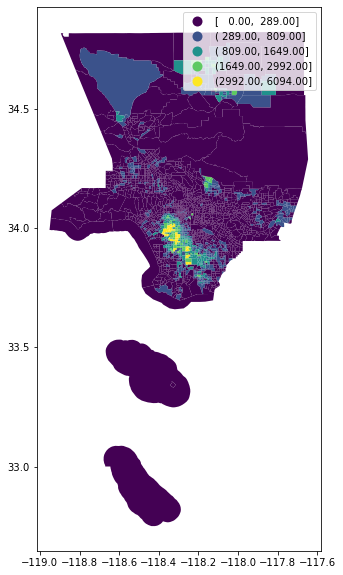

In [50]:
# test mapping it! Here we're specifically looking at the Black population, since the Black community makes up a large chunk of the 77th Division.

tracts_race.plot(figsize=(12,10),
                 column='black',
                 legend=True, 
                 scheme='NaturalBreaks')

In [28]:
# and finally, create our interactive map! here, we chose only to highlight what the White, Black, and Latinx population look like since those are the three most prevalent races in the 7th and Southwest Divisions

m = folium.Map(location=[34.2,-118.2], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')

# plot chorpleth over the base map
folium.Choropleth(
                  name="Black Population",
                  geo_data=tracts_race, # geo data
                  data=tracts_race, # data          
                  key_on='feature.properties.FIPS', # key, or merge column
                  columns=['FIPS', 'black'], # [key, value]
                  fill_color='YlOrRd',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, # line opacity (of the border)
                  legend_name='Black Population (2009-2014 ACS 5-Year estimates)').add_to(m)    # name on the legend color bar

folium.Choropleth(
                  name="Latinx Population",
                  geo_data=tracts_race, # geo data
                  data=tracts_race, # data          
                  key_on='feature.properties.FIPS', # key, or merge column
                  columns=['FIPS', 'latinx'], # [key, value]
                  fill_color='YlOrRd',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, # line opacity (of the border)
                  legend_name='Latinx Population').add_to(m)

folium.Choropleth(
                  name="White Population",
                  geo_data=tracts_race, # geo data
                  data=tracts_race, # data          
                  key_on='feature.properties.FIPS', # key, or merge column
                  columns=['FIPS', 'white'], # [key, value]
                  fill_color='YlOrRd',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, # line opacity (of the border)
                  legend_name='White Population').add_to(m)
    
    
Boundaries = folium.GeoJson(
    lapd_divisions,
    name="LAPD Police Boundaries",
    style_function = lambda x: {
        'color': 'gray',
        'weight': 2,
        'fillOpacity': 0,
        'line_opacity': .5,
        'interactive':False
}).add_to(m)

# add a nice layer control
folium.LayerControl().add_to(m)


m

In [ ]:
# great - what's cool is we can toggle between the three different races to see what they look like 
# save our map

m.save('2009_14_race.html')

In [ ]:
## DONE!